# Different un-supervised models

## Kmeans

In [1]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [57]:
df = pd.read_csv("College_Data",index_col=0)
df.head()

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Abilene Christian University,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
Adelphi University,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
Adrian College,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
Agnes Scott College,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
Alaska Pacific University,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


In [3]:
df.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.00000
mean,3001.638353,2018.804376,779.972973,27.558559,55.796654,3699.907336,855.298584,10440.669241,4357.526384,549.380952,1340.642214,72.660232,79.702703,14.089704,22.743887,9660.171171,65.46332
std,3870.201484,2451.113971,929.176190,17.640364,19.804778,4850.420531,1522.431887,4023.016484,1096.696416,165.105360,677.071454,16.328155,14.722359,3.958349,12.391801,5221.768440,17.17771
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,1.000000,2340.000000,1780.000000,96.000000,250.000000,8.000000,24.000000,2.500000,0.000000,3186.000000,10.00000
25%,776.000000,604.000000,242.000000,15.000000,41.000000,992.000000,95.000000,7320.000000,3597.000000,470.000000,850.000000,62.000000,71.000000,11.500000,13.000000,6751.000000,53.00000
50%,1558.000000,1110.000000,434.000000,23.000000,54.000000,1707.000000,353.000000,9990.000000,4200.000000,500.000000,1200.000000,75.000000,82.000000,13.600000,21.000000,8377.000000,65.00000
75%,3624.000000,2424.000000,902.000000,35.000000,69.000000,4005.000000,967.000000,12925.000000,5050.000000,600.000000,1700.000000,85.000000,92.000000,16.500000,31.000000,10830.000000,78.00000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,21836.000000,21700.000000,8124.000000,2340.000000,6800.000000,103.000000,100.000000,39.800000,64.000000,56233.000000,118.00000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 777 entries, Abilene Christian University to York College of Pennsylvania
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Private      777 non-null    object 
 1   Apps         777 non-null    int64  
 2   Accept       777 non-null    int64  
 3   Enroll       777 non-null    int64  
 4   Top10perc    777 non-null    int64  
 5   Top25perc    777 non-null    int64  
 6   F.Undergrad  777 non-null    int64  
 7   P.Undergrad  777 non-null    int64  
 8   Outstate     777 non-null    int64  
 9   Room.Board   777 non-null    int64  
 10  Books        777 non-null    int64  
 11  Personal     777 non-null    int64  
 12  PhD          777 non-null    int64  
 13  Terminal     777 non-null    int64  
 14  S.F.Ratio    777 non-null    float64
 15  perc.alumni  777 non-null    int64  
 16  Expend       777 non-null    int64  
 17  Grad.Rate    777 non-null    int64  
dtypes: 

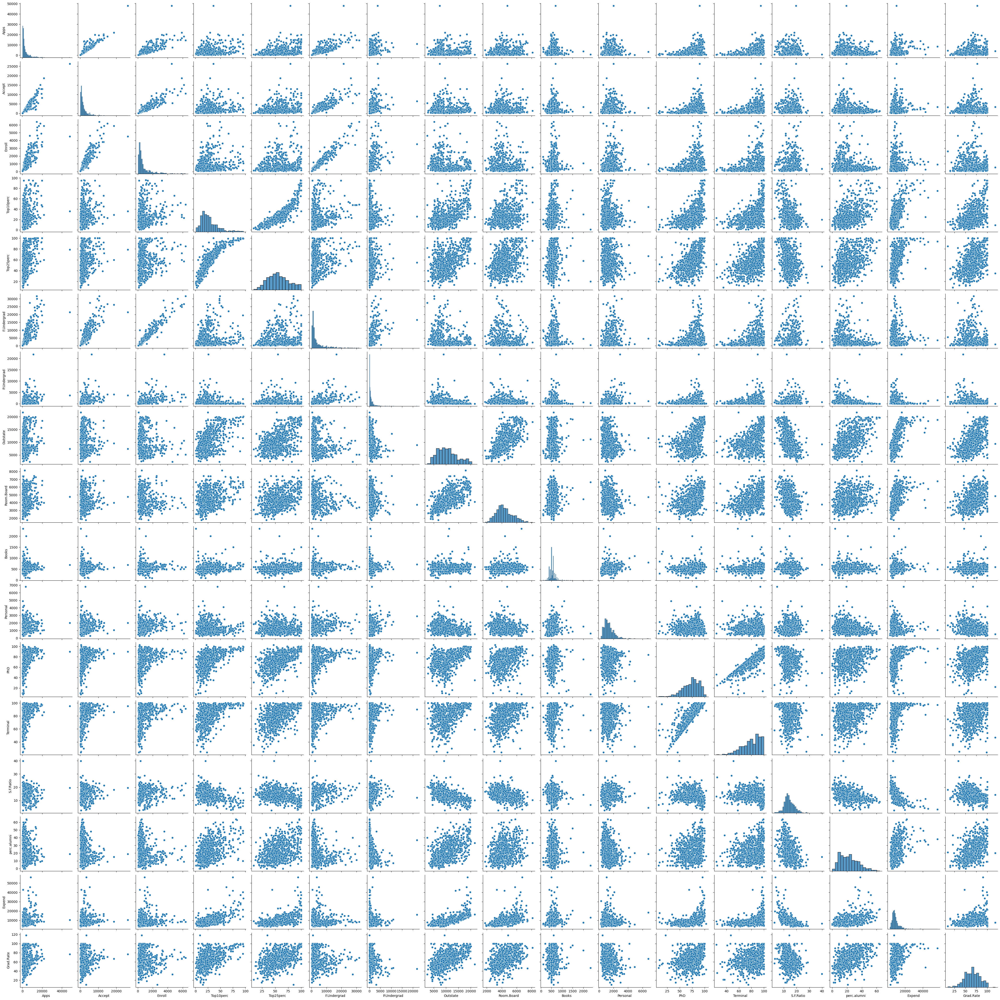

In [5]:
sns.pairplot(data=df)

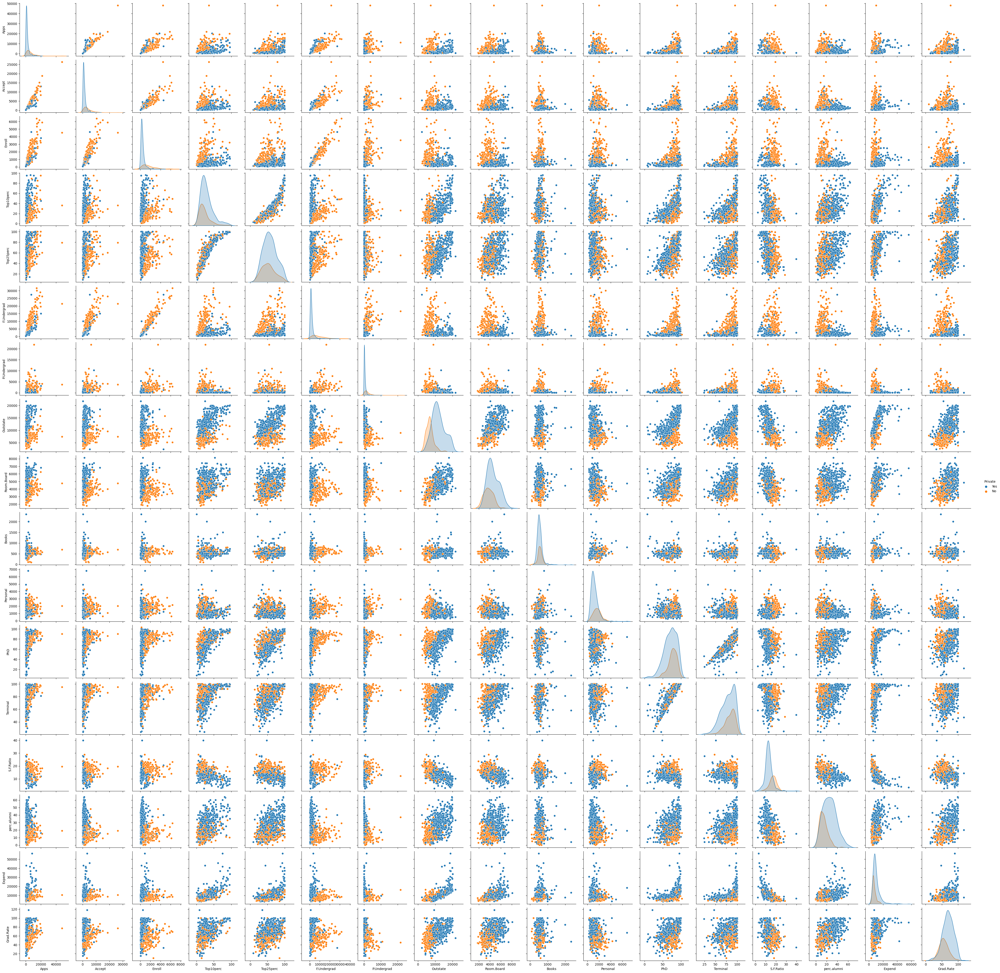

In [6]:
sns.pairplot(df,hue="Private")

In [7]:
df.head()

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Abilene Christian University,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
Adelphi University,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
Adrian College,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
Agnes Scott College,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
Alaska Pacific University,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


In [8]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
wss =[]
scores = []
k= range(2,40)
# Will take some time
for i in k:
    kmeanModel = KMeans(n_clusters=i)
    kmeanModel.fit(df.drop('Private',axis=1))
    wss.append(kmeanModel.inertia_)
    score = silhouette_score(df.drop('Private',axis=1), kmeanModel.labels_, metric='euclidean')
    scores.append(score)

/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value 

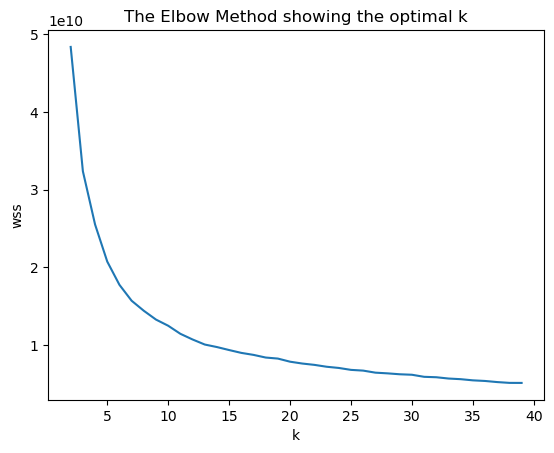

In [9]:

plt.plot(k, wss)
plt.xlabel('k')
plt.ylabel('wss')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [10]:
#!pip install kneed

In [11]:
from kneed import KneeLocator
kl = KneeLocator(k, wss, curve="convex", direction="decreasing")
kl.knee

8

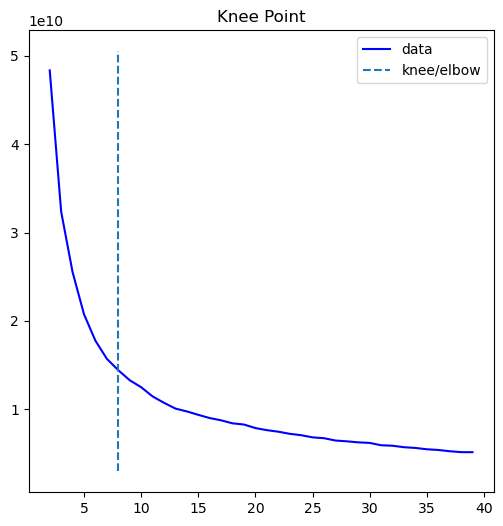

In [12]:
kl.plot_knee()

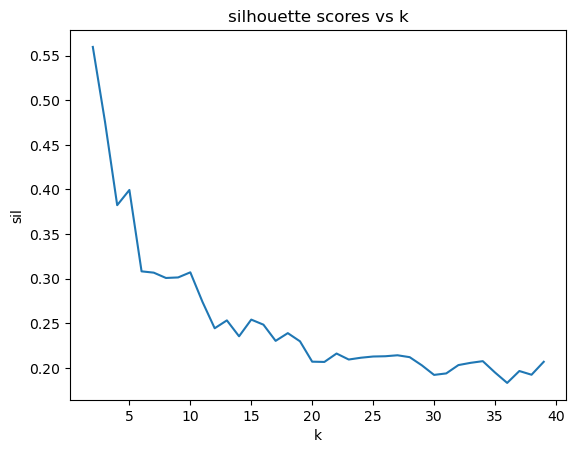

In [13]:
plt.plot(k, scores)
plt.xlabel('k')
plt.ylabel('sil')
plt.title('silhouette scores vs k')
plt.show()

/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value 

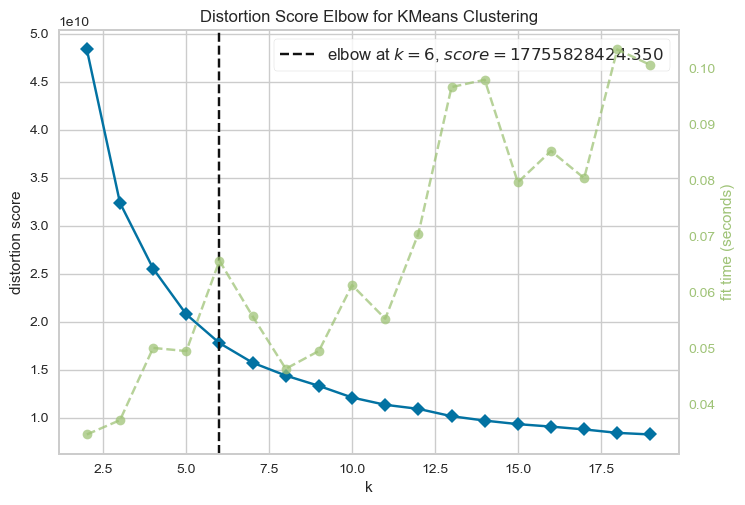

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [14]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
kmeans = KMeans()
visualizer = KElbowVisualizer(kmeans, k=(2,20))

visualizer.fit(df.drop("Private",axis=1))        # Fit the data to the visualizer
visualizer.show() 

In [15]:
kmeans = KMeans(n_clusters=7)
kmeans.fit(df.drop('Private',axis=1))

/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=7)

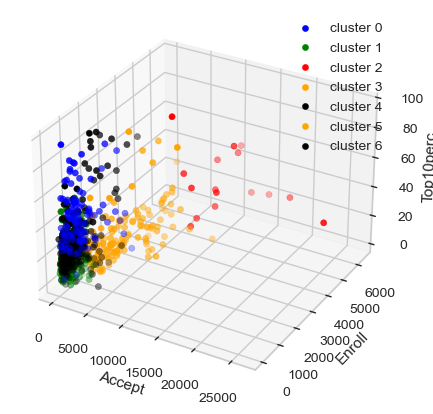

In [16]:
df_col = df.drop("Private",axis=1).columns
y_clusters = kmeans.predict(df.drop("Private",axis=1))
col1 = df_col[1]
col2 = df_col[2]
col3 = df_col[3]
fig = plt.figure(figsize = (5,5))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df[y_clusters == 0][col1],df[y_clusters == 0][col2],df[y_clusters == 0][col3], color = 'blue', label = "cluster 0")
ax.scatter(df[y_clusters == 1][col1],df[y_clusters == 1][col2],df[y_clusters == 1][col3], color = 'green', label = "cluster 1")
ax.scatter(df[y_clusters == 2][col1],df[y_clusters == 2][col2],df[y_clusters == 2][col3], color = 'red', label = "cluster 2")
ax.scatter(df[y_clusters == 3][col1],df[y_clusters == 3][col2],df[y_clusters == 3][col3], color = 'orange', label = "cluster 3")
ax.scatter(df[y_clusters == 4][col1],df[y_clusters == 4][col2],df[y_clusters == 4][col3], color = 'black', label = "cluster 4")
ax.scatter(df[y_clusters == 5][col1],df[y_clusters == 5][col2],df[y_clusters == 5][col3], color = 'orange', label = "cluster 5")
ax.scatter(df[y_clusters == 6][col1],df[y_clusters == 6][col2],df[y_clusters == 6][col3], color = 'black', label = "cluster 6")
ax.set_xlabel(col1)
ax.set_ylabel(col2)
ax.set_zlabel(col3)
ax.legend()
plt.show()

In [17]:
# from itertools import combinations
# for col1,col2,col3 in combinations(df_col, 3):
#     fig = plt.figure(figsize = (5,5))
#     ax = fig.add_subplot(111, projection='3d')
#     ax.scatter(df[y_clusters == 0][col1],df[y_clusters == 0][col2],df[y_clusters == 0][col3], color = 'blue', label = "cluster 0")
#     ax.scatter(df[y_clusters == 1][col1],df[y_clusters == 1][col2],df[y_clusters == 1][col3], color = 'green', label = "cluster 1")
#     ax.scatter(df[y_clusters == 2][col1],df[y_clusters == 2][col2],df[y_clusters == 2][col3], color = 'red', label = "cluster 2")
#     ax.scatter(df[y_clusters == 3][col1],df[y_clusters == 3][col2],df[y_clusters == 3][col3], color = 'orange', label = "cluster 3")
#     ax.scatter(df[y_clusters == 4][col1],df[y_clusters == 4][col2],df[y_clusters == 4][col3], color = 'black', label = "cluster 4")
#     ax.scatter(df[y_clusters == 5][col1],df[y_clusters == 5][col2],df[y_clusters == 5][col3], color = 'orange', label = "cluster 5")
#     ax.scatter(df[y_clusters == 6][col1],df[y_clusters == 6][col2],df[y_clusters == 6][col3], color = 'black', label = "cluster 6")
#     ax.set_xlabel(col1)
#     ax.set_ylabel(col2)
#     ax.set_zlabel(col3)
#     ax.legend()
#     plt.show()

## Agglomerative Clustering hclust

In [18]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
wss =[]
k= range(2,40)
ss.fit(df.drop('Private',axis =1))
df_scaled = ss.transform(df.drop('Private',axis=1))

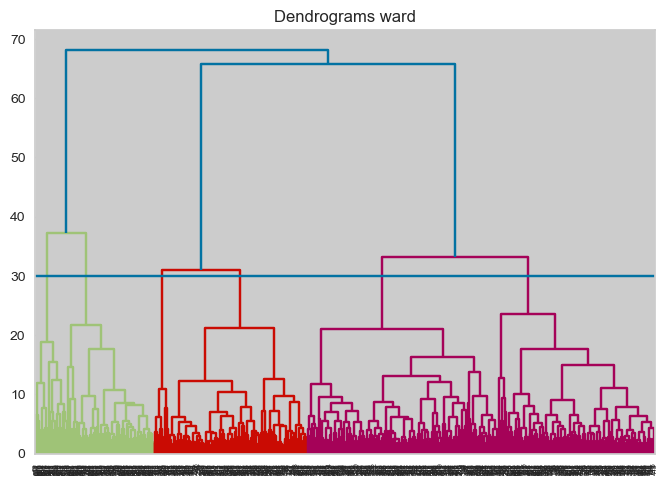

In [19]:
import scipy.cluster.hierarchy as shc 
plt.title("Dendrograms ward")  
dend_w = shc.dendrogram(shc.linkage(df_scaled, method='ward'))
plt.axhline(y=30)

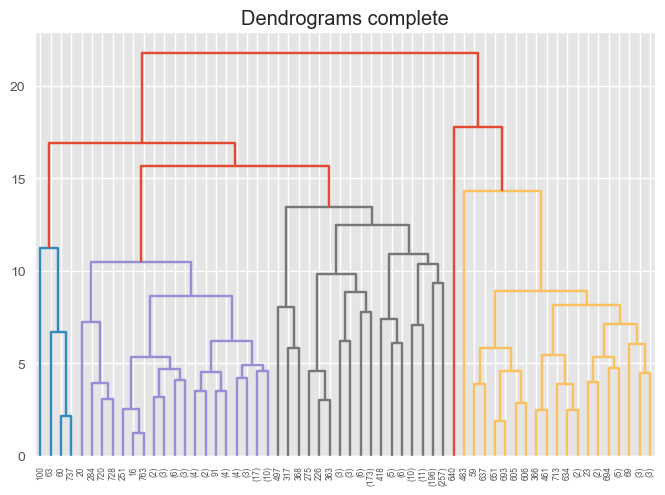

In [75]:
plt.title("Dendrograms complete")  
dend_c = shc.dendrogram(shc.linkage(df_scaled, method='complete'),truncate_mode='level', p=7)
# plt.axhline(y=14)

In [21]:
#!pip3 install tanglegram -U

INFO  : Done. Use matplotlib.pyplot.show() to show plot. (tanglegram.tangle)


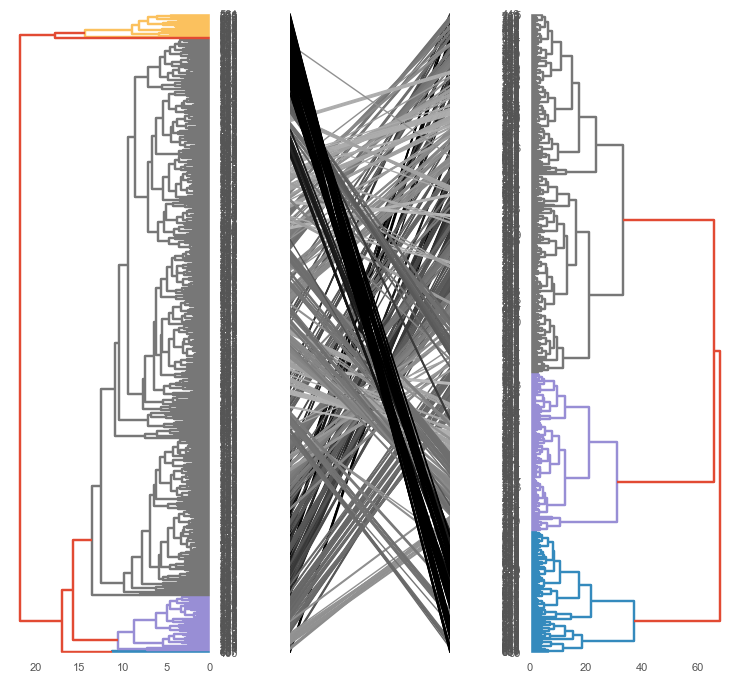

In [70]:
import tanglegram as tg
mat1 = shc.linkage(df_scaled, method='complete')
mat2 = shc.linkage(df_scaled, method='ward')
fig = tg.plot(mat1, mat2, sort=False)
plt.show()

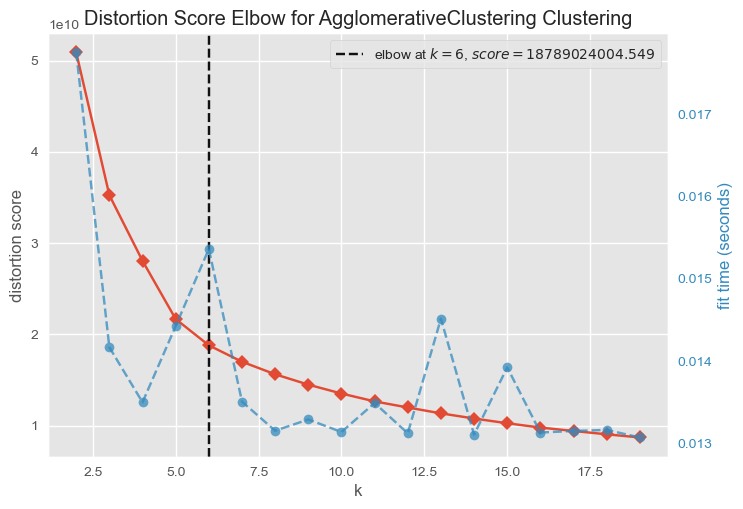

<Axes: title={'center': 'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [23]:
from sklearn.cluster import AgglomerativeClustering
hclust = AgglomerativeClustering()
visualizer = KElbowVisualizer(hclust, k=(2,20))

visualizer.fit(df.drop("Private",axis=1))        # Fit the data to the visualizer
visualizer.show() 

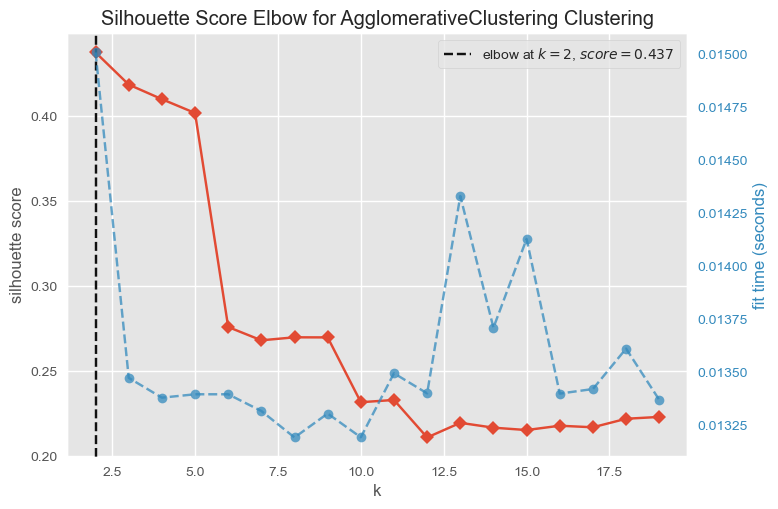

<Axes: title={'center': 'Silhouette Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='silhouette score'>

In [24]:
visualizer = KElbowVisualizer(hclust, k=(2,20),metric="silhouette")

visualizer.fit(df.drop("Private",axis=1))        # Fit the data to the visualizer
visualizer.show() 

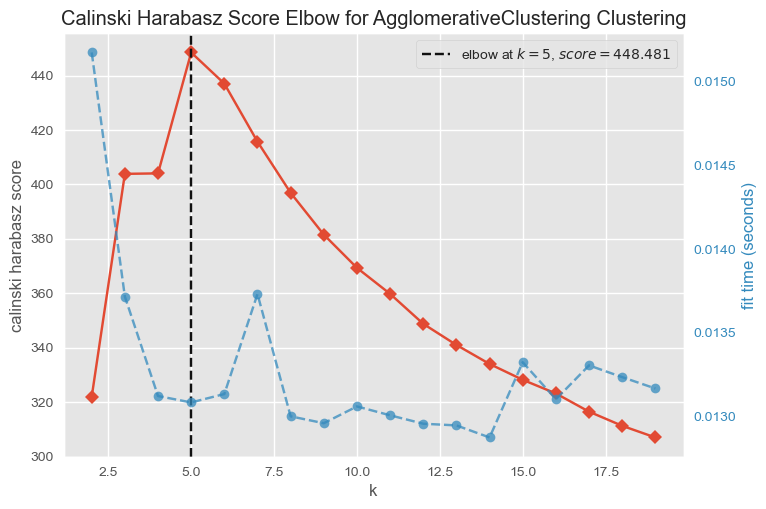

<Axes: title={'center': 'Calinski Harabasz Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [25]:
visualizer = KElbowVisualizer(hclust, k=(2,20),metric="calinski_harabasz")

visualizer.fit(df.drop("Private",axis=1))        # Fit the data to the visualizer
visualizer.show() 

In [26]:
hclust = AgglomerativeClustering(n_clusters=6)
hclust.fit_predict(df_scaled)

array([4, 4, 4, 2, 4, 0, 0, 2, 2, 4, 2, 2, 0, 2, 4, 0, 2, 4, 4, 4, 5, 1,
       4, 3, 0, 4, 2, 1, 0, 2, 0, 2, 4, 4, 0, 0, 2, 2, 0, 1, 0, 0, 0, 4,
       2, 4, 0, 4, 2, 4, 0, 0, 4, 4, 2, 0, 1, 4, 0, 3, 0, 1, 4, 0, 2, 0,
       4, 4, 0, 3, 5, 2, 2, 0, 2, 0, 0, 0, 1, 1, 0, 4, 4, 0, 0, 4, 2, 2,
       0, 4, 0, 2, 0, 0, 2, 4, 2, 4, 4, 0, 0, 2, 1, 1, 1, 4, 2, 4, 2, 0,
       0, 0, 4, 4, 2, 2, 0, 2, 1, 4, 0, 0, 2, 2, 0, 1, 4, 2, 0, 0, 2, 0,
       4, 0, 4, 4, 0, 2, 2, 2, 2, 1, 4, 0, 5, 0, 4, 4, 4, 2, 0, 2, 2, 4,
       4, 0, 4, 0, 5, 2, 4, 4, 2, 2, 2, 4, 4, 4, 4, 4, 4, 2, 2, 0, 5, 2,
       1, 1, 4, 4, 4, 1, 4, 4, 2, 0, 0, 4, 4, 4, 0, 5, 4, 2, 0, 4, 2, 4,
       4, 4, 0, 1, 0, 3, 4, 2, 4, 4, 4, 0, 4, 4, 4, 2, 4, 4, 0, 4, 1, 3,
       0, 5, 2, 1, 4, 2, 4, 0, 0, 4, 2, 4, 4, 1, 0, 0, 4, 2, 0, 0, 2, 4,
       2, 2, 2, 1, 0, 4, 0, 2, 5, 2, 4, 0, 2, 2, 2, 0, 2, 2, 2, 0, 4, 0,
       4, 4, 0, 0, 2, 1, 2, 0, 4, 1, 3, 4, 0, 1, 0, 1, 4, 4, 4, 2, 5, 0,
       4, 2, 1, 4, 1, 4, 2, 0, 0, 4, 2, 4, 0, 2, 4,

## BIRCH

In [27]:
from sklearn.cluster import Birch

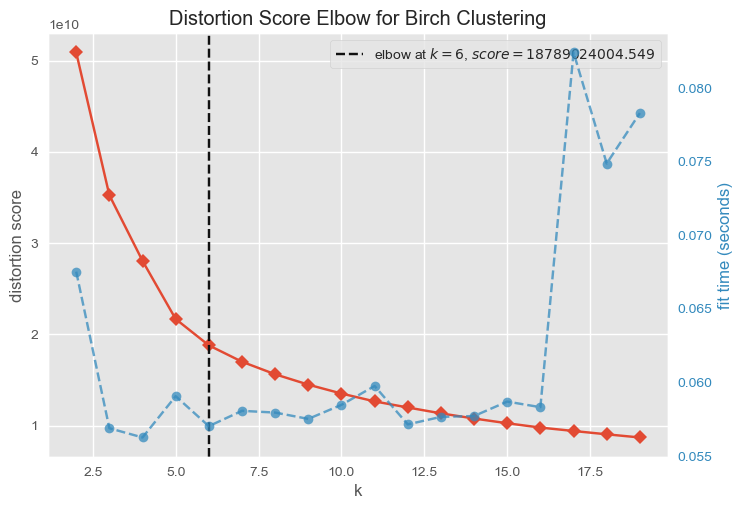

<Axes: title={'center': 'Distortion Score Elbow for Birch Clustering'}, xlabel='k', ylabel='distortion score'>

In [28]:
birch = Birch(threshold=0.01)
visualizer = KElbowVisualizer(birch, k=(2,20))

visualizer.fit(df.drop("Private",axis=1))        # Fit the data to the visualizer
visualizer.show() 

In [29]:
birch = Birch(threshold=0.01, n_clusters=6)
# fit the model
birch.fit(df.drop("Private",axis=1))

Birch(n_clusters=6, threshold=0.01)

In [30]:
birch_yhat = birch.predict(df.drop("Private",axis=1))
birch_yhat

array([3, 5, 5, 4, 3, 5, 5, 4, 4, 3, 4, 4, 3, 5, 3, 3, 4, 3, 3, 3, 2, 0,
       3, 1, 4, 3, 5, 0, 5, 5, 3, 5, 3, 3, 5, 3, 4, 4, 5, 0, 5, 3, 3, 3,
       4, 3, 3, 4, 5, 3, 3, 3, 3, 3, 5, 3, 0, 3, 3, 1, 4, 0, 4, 5, 4, 3,
       3, 3, 3, 1, 2, 4, 4, 5, 5, 3, 3, 5, 0, 0, 5, 3, 3, 5, 5, 3, 4, 2,
       5, 3, 5, 4, 3, 3, 4, 3, 4, 3, 5, 3, 5, 5, 0, 0, 0, 3, 5, 4, 4, 3,
       3, 3, 3, 3, 4, 4, 3, 4, 0, 3, 5, 3, 4, 4, 5, 0, 3, 5, 5, 3, 5, 5,
       5, 3, 5, 3, 5, 4, 5, 4, 4, 0, 3, 3, 2, 3, 3, 5, 3, 4, 5, 4, 4, 3,
       3, 3, 3, 5, 2, 4, 3, 3, 4, 4, 4, 3, 3, 3, 3, 3, 3, 5, 4, 3, 2, 4,
       0, 0, 3, 5, 3, 0, 3, 3, 4, 5, 5, 5, 3, 3, 3, 2, 3, 3, 3, 3, 5, 3,
       3, 3, 5, 0, 3, 1, 3, 5, 3, 3, 3, 5, 5, 3, 3, 4, 5, 3, 3, 5, 0, 4,
       3, 2, 0, 0, 3, 4, 3, 5, 5, 3, 4, 3, 3, 0, 3, 3, 3, 4, 3, 5, 5, 3,
       4, 5, 4, 0, 3, 3, 3, 4, 2, 4, 3, 3, 5, 4, 4, 5, 4, 4, 5, 3, 3, 3,
       3, 3, 5, 3, 4, 0, 5, 3, 3, 0, 1, 3, 5, 1, 4, 0, 0, 3, 3, 5, 2, 3,
       3, 4, 0, 3, 3, 3, 4, 3, 5, 3, 4, 3, 5, 4, 3,

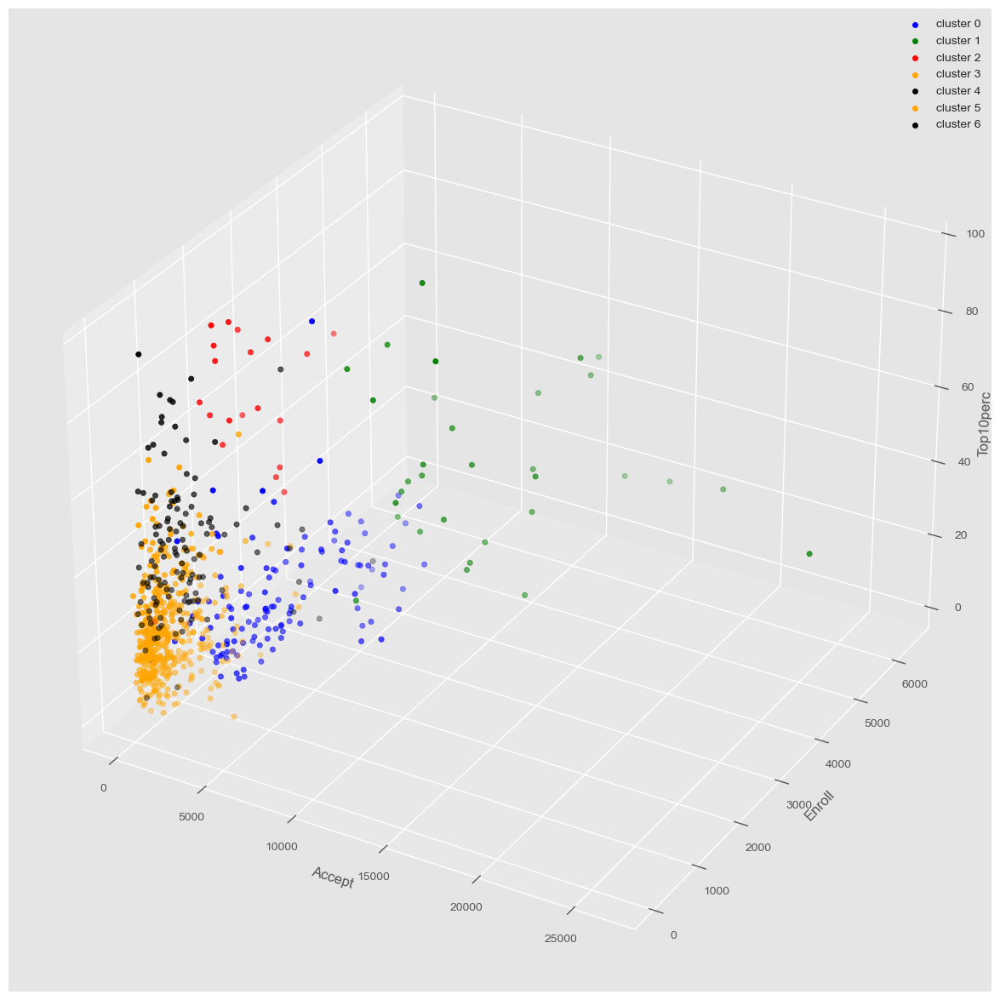

In [65]:
df_col = df.drop("Private",axis=1).columns
y_clusters = birch.predict(df.drop("Private",axis=1))
col1 = df_col[1]
col2 = df_col[2]
col3 = df_col[3]
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df[y_clusters == 0][col1],df[y_clusters == 0][col2],df[y_clusters == 0][col3], color = 'blue', label = "cluster 0")
ax.scatter(df[y_clusters == 1][col1],df[y_clusters == 1][col2],df[y_clusters == 1][col3], color = 'green', label = "cluster 1")
ax.scatter(df[y_clusters == 2][col1],df[y_clusters == 2][col2],df[y_clusters == 2][col3], color = 'red', label = "cluster 2")
ax.scatter(df[y_clusters == 3][col1],df[y_clusters == 3][col2],df[y_clusters == 3][col3], color = 'orange', label = "cluster 3")
ax.scatter(df[y_clusters == 4][col1],df[y_clusters == 4][col2],df[y_clusters == 4][col3], color = 'black', label = "cluster 4")
ax.scatter(df[y_clusters == 5][col1],df[y_clusters == 5][col2],df[y_clusters == 5][col3], color = 'orange', label = "cluster 5")
ax.scatter(df[y_clusters == 6][col1],df[y_clusters == 6][col2],df[y_clusters == 6][col3], color = 'black', label = "cluster 6")
ax.set_xlabel(col1)
ax.set_ylabel(col2)
ax.set_zlabel(col3)
ax.legend()
plt.show()

## DBSCAN

In [32]:
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=0.30, min_samples=9)


In [33]:
db_yhat = dbscan.fit(df.drop("Private",axis=1))
db_yhat 

DBSCAN(eps=0.3, min_samples=9)

## Spectral clustering

/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/harikrishnadev/Library/jupyterlab-desktop/jlab_server/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/harikrishnadev/Library/jupyterlab-des

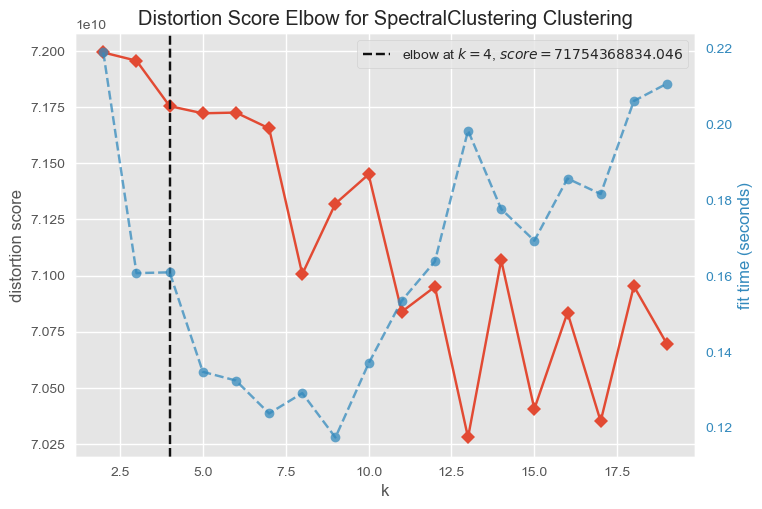

<Axes: title={'center': 'Distortion Score Elbow for SpectralClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [34]:
from sklearn.cluster import SpectralClustering
sc = SpectralClustering(affinity="rbf")
visualizer = KElbowVisualizer(sc, k=(2,20))

visualizer.fit(df.drop("Private",axis=1))        # Fit the data to the visualizer
visualizer.show() 

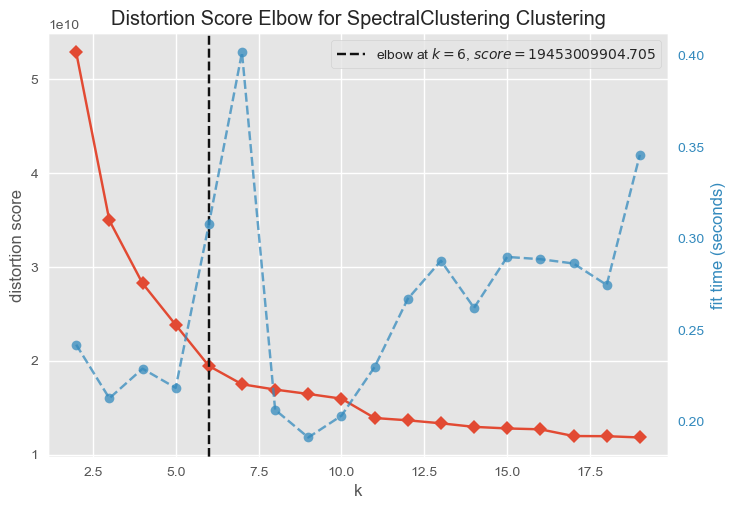

<Axes: title={'center': 'Distortion Score Elbow for SpectralClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [35]:
sc = SpectralClustering(affinity="nearest_neighbors")
visualizer = KElbowVisualizer(sc, k=(2,20))

visualizer.fit(df.drop("Private",axis=1))        # Fit the data to the visualizer
visualizer.show() 

In [36]:
sc = SpectralClustering(n_clusters=6,affinity="nearest_neighbors")
sc_hat = sc.fit(df.drop("Private",axis=1))
sc_hat

SpectralClustering(affinity='nearest_neighbors', n_clusters=6)

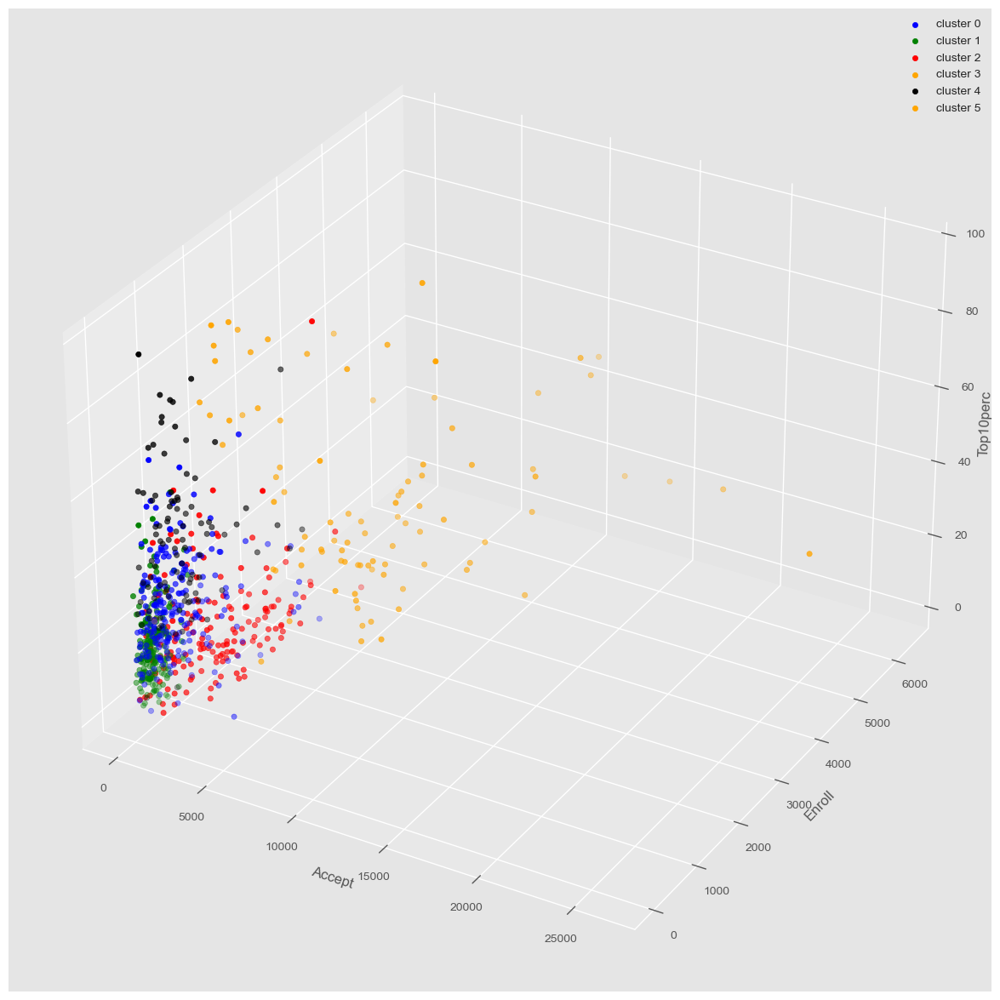

In [37]:
df_col = df.drop("Private",axis=1).columns
y_clusters = sc.labels_
col1 = df_col[1]
col2 = df_col[2]
col3 = df_col[3]
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df[y_clusters == 0][col1],df[y_clusters == 0][col2],df[y_clusters == 0][col3], color = 'blue', label = "cluster 0")
ax.scatter(df[y_clusters == 1][col1],df[y_clusters == 1][col2],df[y_clusters == 1][col3], color = 'green', label = "cluster 1")
ax.scatter(df[y_clusters == 2][col1],df[y_clusters == 2][col2],df[y_clusters == 2][col3], color = 'red', label = "cluster 2")
ax.scatter(df[y_clusters == 3][col1],df[y_clusters == 3][col2],df[y_clusters == 3][col3], color = 'orange', label = "cluster 3")
ax.scatter(df[y_clusters == 4][col1],df[y_clusters == 4][col2],df[y_clusters == 4][col3], color = 'black', label = "cluster 4")
ax.scatter(df[y_clusters == 5][col1],df[y_clusters == 5][col2],df[y_clusters == 5][col3], color = 'orange', label = "cluster 5")
ax.set_xlabel(col1)
ax.set_ylabel(col2)
ax.set_zlabel(col3)
ax.legend()
plt.show()

## Gaussian mixtures

In [58]:
from sklearn.mixture import GaussianMixture
gm = GaussianMixture(n_components=4, random_state=42)
gm.fit(df.drop("Private",axis=1))
labels = gm.predict(df.drop("Private",axis=1))

In [63]:
np.unique(labels)

array([0, 1, 2, 3])

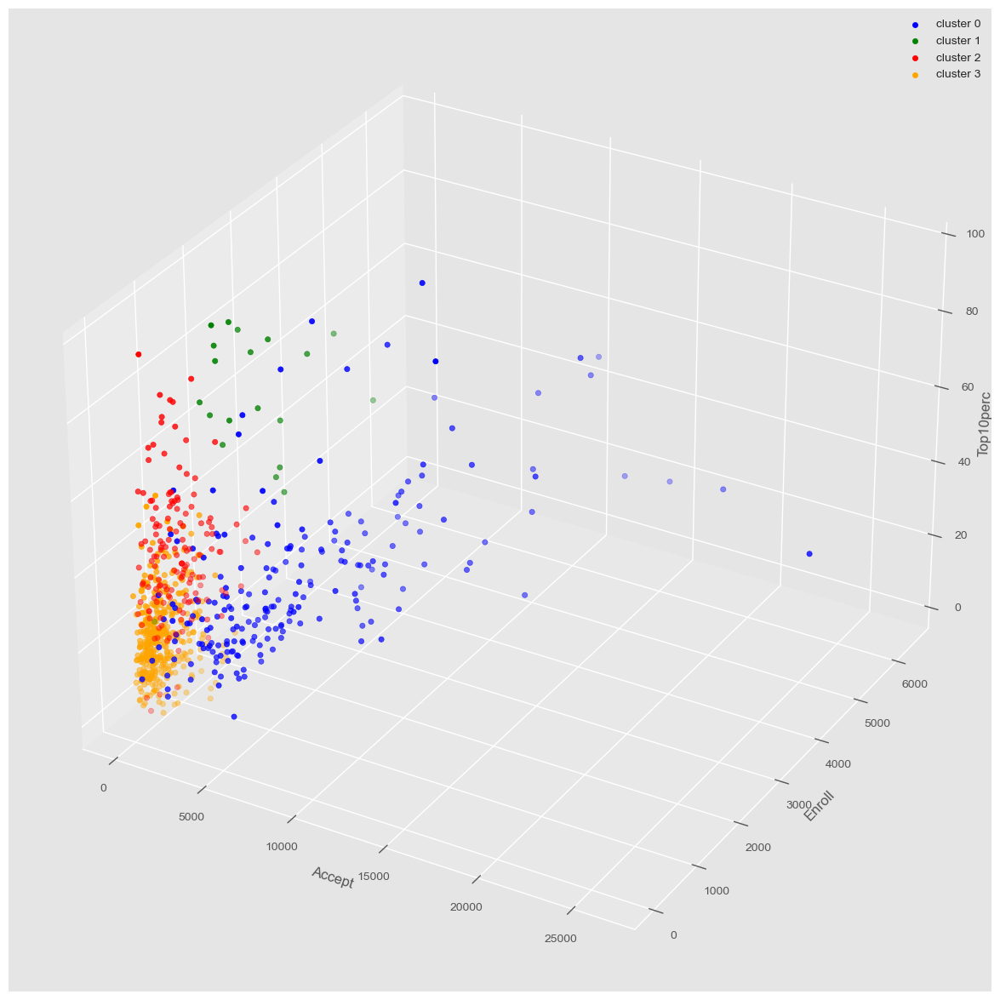

In [64]:
y_clusters = labels
col1 = df_col[1]
col2 = df_col[2]
col3 = df_col[3]
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df[y_clusters == 0][col1],df[y_clusters == 0][col2],df[y_clusters == 0][col3], color = 'blue', label = "cluster 0")
ax.scatter(df[y_clusters == 1][col1],df[y_clusters == 1][col2],df[y_clusters == 1][col3], color = 'green', label = "cluster 1")
ax.scatter(df[y_clusters == 2][col1],df[y_clusters == 2][col2],df[y_clusters == 2][col3], color = 'red', label = "cluster 2")
ax.scatter(df[y_clusters == 3][col1],df[y_clusters == 3][col2],df[y_clusters == 3][col3], color = 'orange', label = "cluster 3")
ax.set_xlabel(col1)
ax.set_ylabel(col2)
ax.set_zlabel(col3)
ax.legend()
plt.show()

# Biclustering and coclustering models

### Adding new data and work on that

Link: https://www.kaggle.com/datasets/sammy123/lower-back-pain-symptoms-dataset

In [40]:
df = pd.read_csv("Dataset_spine.csv",index_col=0)
df.head()

,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Col11,Col12,Class_att,Unnamed: 13
Col1,,,,,,,,,,,,,
63.027817,22.552586,39.609117,40.475232,98.672917,-0.254400,0.744503,12.5661,14.5386,15.30468,-28.658501,43.5123,Abnormal,NaN
39.056951,10.060991,25.015378,28.995960,114.405425,4.564259,0.415186,12.8874,17.5323,16.78486,-25.530607,16.1102,Abnormal,NaN
68.832021,22.218482,50.092194,46.613539,105.985135,-3.530317,0.474889,26.8343,17.4861,16.65897,-29.031888,19.2221,Abnormal,Prediction is done by using binary classificat...
69.297008,24.652878,44.311238,44.644130,101.868495,11.211523,0.369345,23.5603,12.7074,11.42447,-30.470246,18.8329,Abnormal,NaN
49.712859,9.652075,28.317406,40.060784,108.168725,7.918501,0.543360,35.4940,15.9546,8.87237,-16.378376,24.9171,Abnormal,NaN


In [41]:
from sklearn.datasets import make_checkerboard
from sklearn.cluster import SpectralBiclustering
from sklearn.metrics import consensus_score

In [42]:
column_names = ("pelvic_incidence",
"pelvic_tilt",
"lumbar_lordosis_angle",
"sacral_slope",
"pelvic_radius",
"degree_spondylolisthesis",
"pelvic_slope",
"Direct_tilt",
"thoracic_slope",
"cervical_tilt",
"sacrum_angle",
"scoliosis_slope")

In [43]:
rename = {}
for i in range(0,12):
    temp = "Col" + str(i+1)
    rename[temp] = column_names[i]

df = df.rename(columns = rename)

In [44]:
df = df.drop("Unnamed: 13",1)
target = "Class_att"
features = [feature for feature in df.columns if feature != target]
df.head()

/var/folders/3d/fk1zpy415g31bg07yrkc5qbm0000gn/T/ipykernel_13004/3704041207.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df = df.drop("Unnamed: 13",1)


,pelvic_tilt,lumbar_lordosis_angle,sacral_slope,pelvic_radius,degree_spondylolisthesis,pelvic_slope,Direct_tilt,thoracic_slope,cervical_tilt,sacrum_angle,scoliosis_slope,Class_att
Col1,,,,,,,,,,,,
63.027817,22.552586,39.609117,40.475232,98.672917,-0.254400,0.744503,12.5661,14.5386,15.30468,-28.658501,43.5123,Abnormal
39.056951,10.060991,25.015378,28.995960,114.405425,4.564259,0.415186,12.8874,17.5323,16.78486,-25.530607,16.1102,Abnormal
68.832021,22.218482,50.092194,46.613539,105.985135,-3.530317,0.474889,26.8343,17.4861,16.65897,-29.031888,19.2221,Abnormal
69.297008,24.652878,44.311238,44.644130,101.868495,11.211523,0.369345,23.5603,12.7074,11.42447,-30.470246,18.8329,Abnormal
49.712859,9.652075,28.317406,40.060784,108.168725,7.918501,0.543360,35.4940,15.9546,8.87237,-16.378376,24.9171,Abnormal


In [45]:
from sklearn.preprocessing import normalize, scale
df_norm = normalize(df.drop(target,1))

/var/folders/3d/fk1zpy415g31bg07yrkc5qbm0000gn/T/ipykernel_13004/3359866110.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df_norm = normalize(df.drop(target,1))


In [46]:
from sklearn.cluster import SpectralBiclustering, SpectralCoclustering
from numpy import argsort
from matplotlib.pyplot import show, imshow, figure, subplot, suptitle, tight_layout, xticks, xlabel

Text(0.5, 1.0, 'Original dataset')

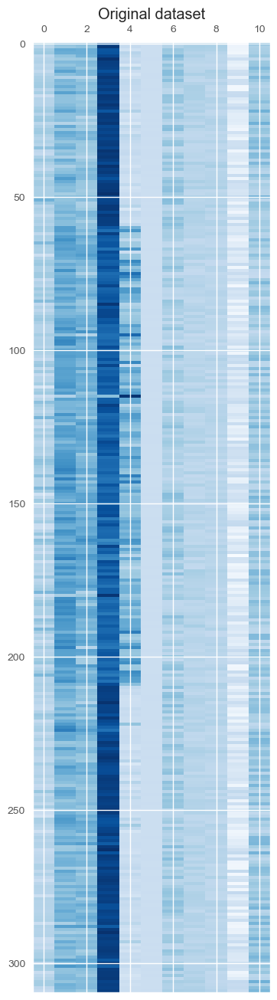

In [47]:
plt.matshow(df_norm,aspect='auto', cmap=plt.cm.Blues)
plt.title("Original dataset")

In [48]:
n=10

In [49]:
cocluster = SpectralCoclustering(n_clusters = n)
cocluster.fit(df_norm)
cocluster_fit_data = df_norm[argsort(cocluster.row_labels_)]
cocluster_fit_data = cocluster_fit_data[:, argsort(cocluster.column_labels_)]

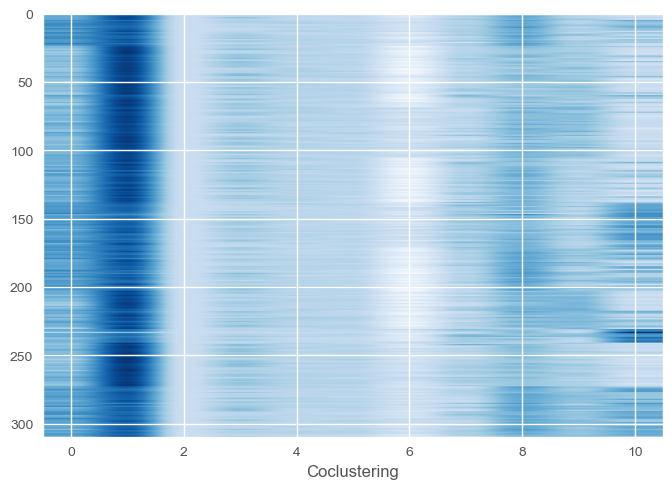

In [50]:
ax = imshow(cocluster_fit_data, aspect='auto', cmap=plt.cm.Blues)
xlabel("Coclustering")
show()

In [51]:
bicluster = SpectralBiclustering(n_clusters = n)
bicluster.fit(df_norm)
bicluster_fit_data = df_norm[argsort(bicluster.row_labels_)]
bicluster_fit_data = bicluster_fit_data[:, argsort(bicluster.column_labels_)]

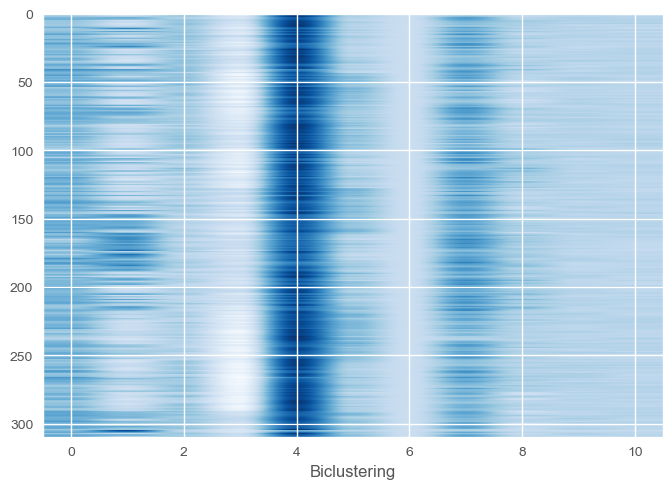

In [52]:
ax = imshow(bicluster_fit_data, aspect='auto', cmap=plt.cm.Blues)
xlabel("Biclustering")
show()